## Лабораторная работа №3 Морфология изображений и обнаружение границ

In [ ]:
# импорт библиотек
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm

##Часть 1 Простые расчеты на морфологию изображений

##Задание 1

1. Пусть задано бинарное изображение I:

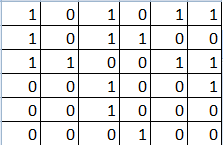

2. Выполните сужение изображения с помощью шаблона J:

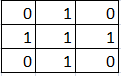

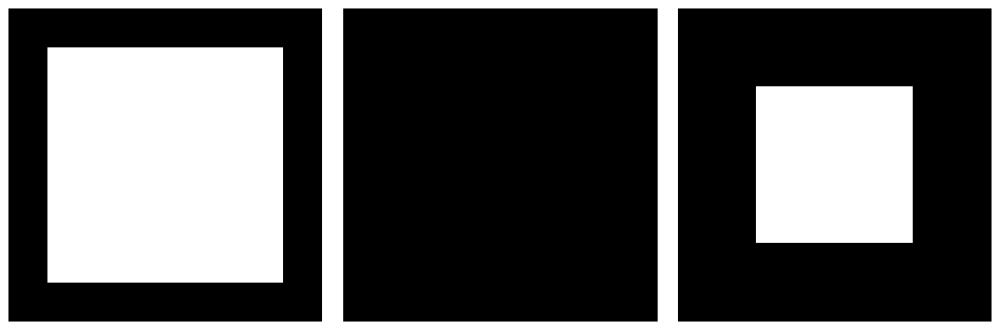

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

I = np.array([
    [0, 0, 0, 0, 0, 0, 0, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 0, 0, 0, 0, 0, 0, 0]
], dtype=np.uint8)

J = np.array([
    [1, 1, 1],
    [1, 1, 1],
    [1, 1, 1]
], dtype=np.uint8)

def erosion(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    result = np.zeros_like(image)

    for i in range(h):
        for j in range(w):
            region = padded[i:i+kh, j:j+kw]
            if np.array_equal(region & kernel, kernel):
                result[i, j] = 1

    return result

I_eroded = erosion(I, J)

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(I, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(J, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(I_eroded, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

##Задание 2

1. Пусть задано бинарное изображение I:

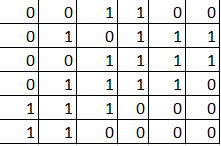

2. Выполните его расширение с помощью шаблона J:

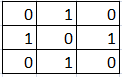

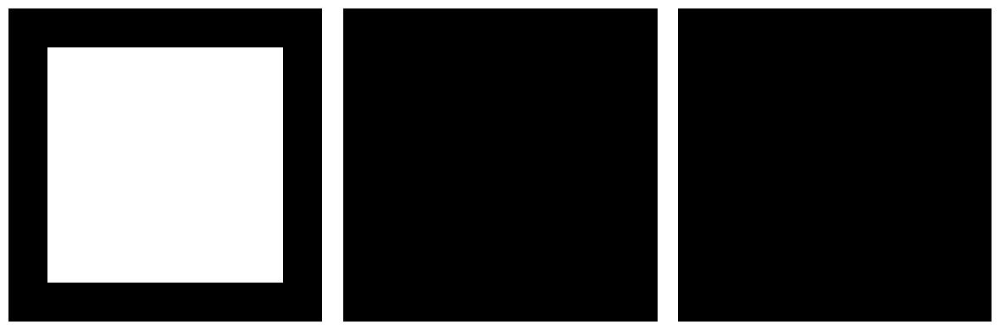

In [ ]:
def dilation(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    result = np.zeros_like(image)

    for i in range(h):
        for j in range(w):
            region = padded[i:i+kh, j:j+kw]
            if np.any(region & kernel):
                result[i, j] = 1

    return result

I_dilated = dilation(I, J)

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(I, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(J, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(I_dilated, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


## Задание 3

Для изображения из задания 1 выполните операцию закрытия с тем же шаблоном

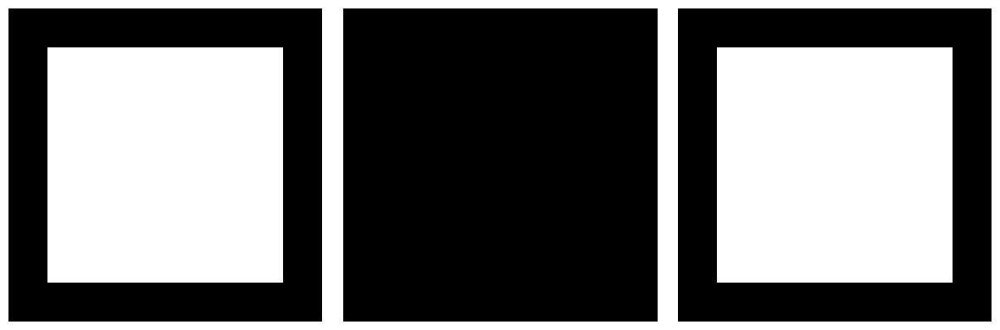

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

I = np.array([
    [0, 0, 0, 0, 0, 0, 0, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 1, 1, 1, 1, 1, 1, 0],
    [0, 0, 0, 0, 0, 0, 0, 0]
], dtype=np.uint8)

J = np.array([
    [1, 1, 1],
    [1, 1, 1],
    [1, 1, 1]
], dtype=np.uint8)

def dilation(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    result = np.zeros_like(image)

    for i in range(h):
        for j in range(w):
            region = padded[i:i+kh, j:j+kw]
            if np.any(region & kernel):
                result[i, j] = 1

    return result

def erosion(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    result = np.zeros_like(image)

    for i in range(h):
        for j in range(w):
            region = padded[i:i+kh, j:j+kw]
            if np.array_equal(region & kernel, kernel):
                result[i, j] = 1

    return result

I_dilated = dilation(I, J)
I_closed = erosion(I_dilated, J)

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(I, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(I_dilated, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(I_closed, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

## Задание 4

Для изображения из задания 2 выполните операцию открытия с тем же шаблоном

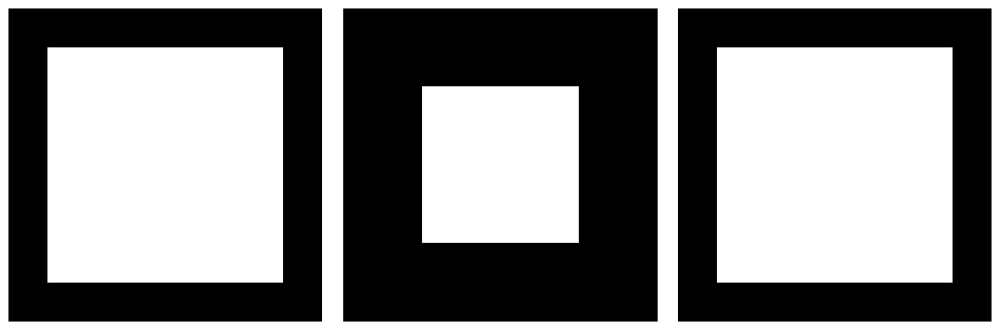

In [ ]:
I_eroded = erosion(I, J)
I_opened = dilation(I_eroded, J)

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.imshow(I, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(I_eroded, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(I_opened, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

#Часть 2 Использование OpenCV и алгоритмов для морфологических операций с изображениями

## Задание 1

1. Загрузите бинарное изображение "figures.jpg"

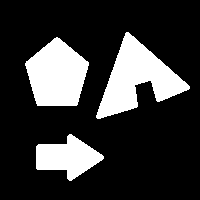

2. Добавьте шума "соль и перец" так, чтобы доля зашумлений составляла 1%, 2%, 5%, 10%, 25% и 50% соответственно

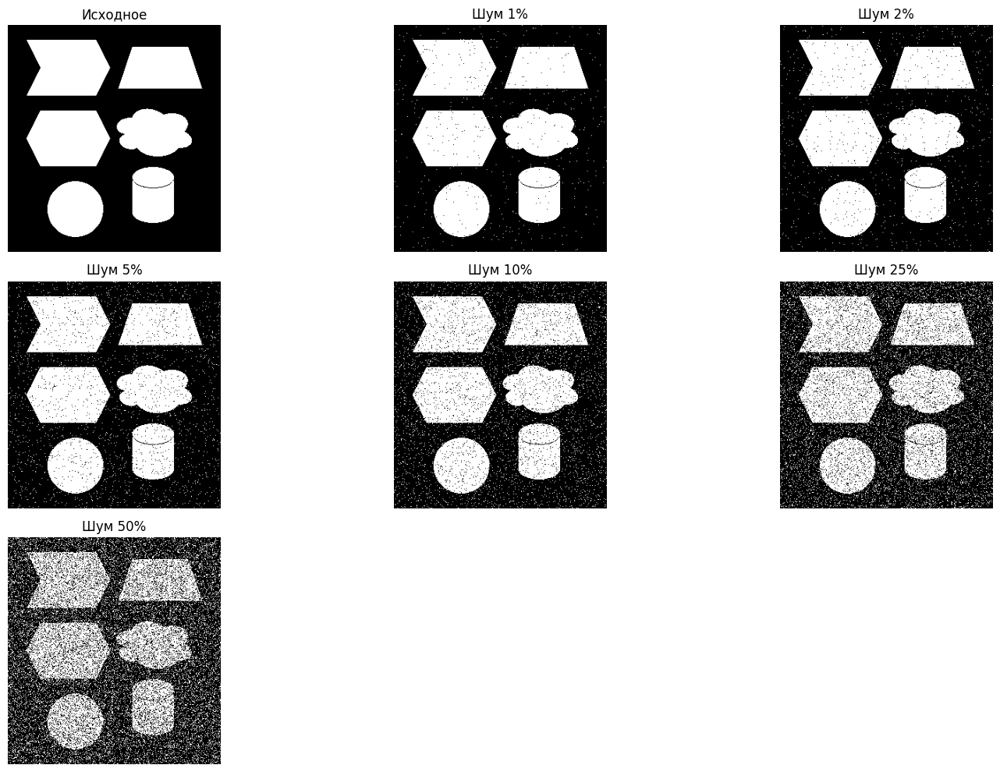

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread('figures.jpg', 0)
_, img_binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

noise_levels = [0.01, 0.02, 0.05, 0.10, 0.25, 0.50]
noisy_images = []

for level in noise_levels:
    noisy_img = img_binary.copy()
    salt_mask = np.random.random(img_binary.shape) < level/2
    pepper_mask = np.random.random(img_binary.shape) < level/2
    noisy_img[salt_mask] = 255
    noisy_img[pepper_mask] = 0
    noisy_images.append(noisy_img)

plt.figure(figsize=(15, 10))

plt.subplot(3, 3, 1)
plt.imshow(img_binary, cmap='gray')
plt.title('Исходное')
plt.axis('off')

for i, (level, noisy_img) in enumerate(zip(noise_levels, noisy_images)):
    plt.subplot(3, 3, i+2)
    plt.imshow(noisy_img, cmap='gray')
    plt.title(f'Шум {int(level*100)}%')
    plt.axis('off')

plt.tight_layout()
plt.show()

##Задание 2
Выполните эрозию зашумленных изображений с помощью OpenCV (https://docs.opencv.org/3.4/db/df6/tutorial_erosion_dilatation.html)

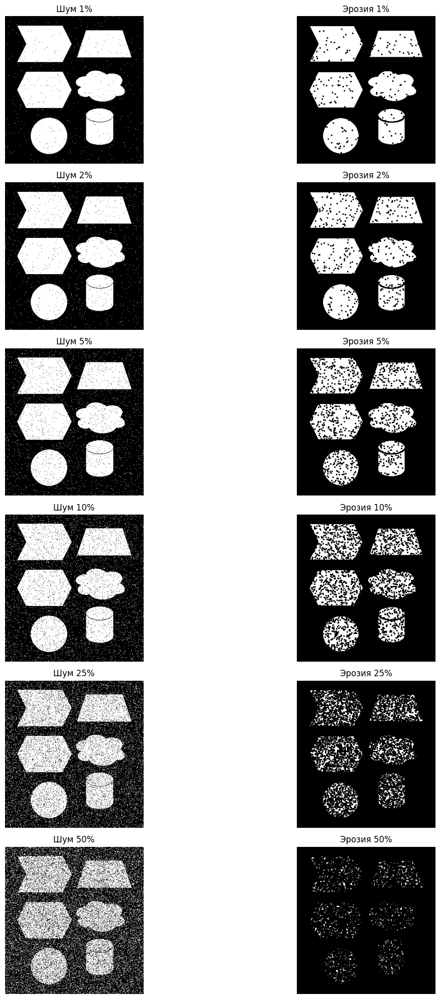

In [ ]:
noise_levels = [0.01, 0.02, 0.05, 0.10, 0.25, 0.50]
noisy_images = []

for level in noise_levels:
    noisy_img = img_binary.copy()
    salt_mask = np.random.random(img_binary.shape) < level/2
    pepper_mask = np.random.random(img_binary.shape) < level/2
    noisy_img[salt_mask] = 255
    noisy_img[pepper_mask] = 0
    noisy_images.append(noisy_img)

kernel = np.ones((3,3), np.uint8)
eroded_images = [cv2.erode(img, kernel) for img in noisy_images]

plt.figure(figsize=(15, 20))

for i, (level, noisy_img, eroded_img) in enumerate(zip(noise_levels, noisy_images, eroded_images)):
    plt.subplot(6, 2, i*2+1)
    plt.imshow(noisy_img, cmap='gray')
    plt.title(f'Шум {int(level*100)}%')
    plt.axis('off')

    plt.subplot(6, 2, i*2+2)
    plt.imshow(eroded_img, cmap='gray')
    plt.title(f'Эрозия {int(level*100)}%')
    plt.axis('off')

plt.tight_layout()
plt.show()

##Задание 3

Выполните дилотацию зашумленных изображений с помощью OpenCV (https://docs.opencv.org/3.4/db/df6/tutorial_erosion_dilatation.html)

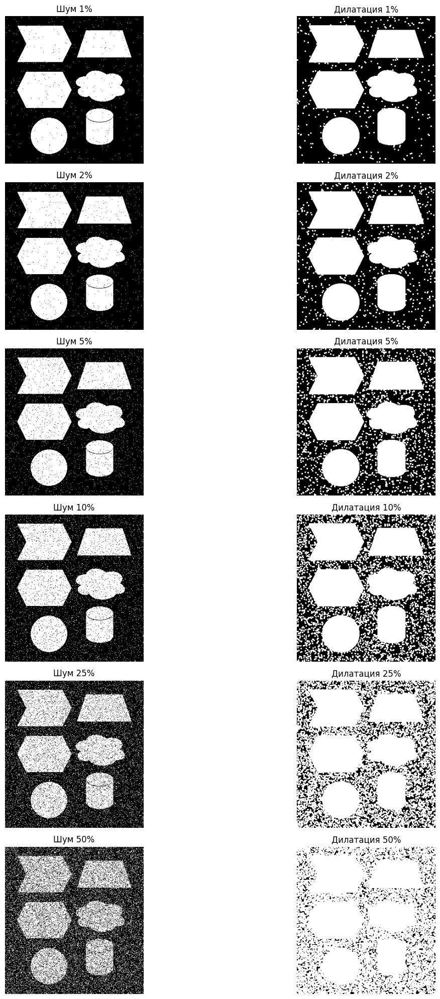

In [ ]:
noise_levels = [0.01, 0.02, 0.05, 0.10, 0.25, 0.50]
noisy_images = []

for level in noise_levels:
    noisy_img = img_binary.copy()
    salt_mask = np.random.random(img_binary.shape) < level/2
    pepper_mask = np.random.random(img_binary.shape) < level/2
    noisy_img[salt_mask] = 255
    noisy_img[pepper_mask] = 0
    noisy_images.append(noisy_img)

kernel = np.ones((3,3), np.uint8)
dilated_images = [cv2.dilate(img, kernel) for img in noisy_images]

plt.figure(figsize=(15, 20))

for i, (level, noisy_img, dilated_img) in enumerate(zip(noise_levels, noisy_images, dilated_images)):
    plt.subplot(6, 2, i*2+1)
    plt.imshow(noisy_img, cmap='gray')
    plt.title(f'Шум {int(level*100)}%')
    plt.axis('off')

    plt.subplot(6, 2, i*2+2)
    plt.imshow(dilated_img, cmap='gray')
    plt.title(f'Дилатация {int(level*100)}%')
    plt.axis('off')

plt.tight_layout()
plt.show()

##Задание 4
Выполните открытие и закрытие зашумленных изображений, используя функции эрозии и дилотации

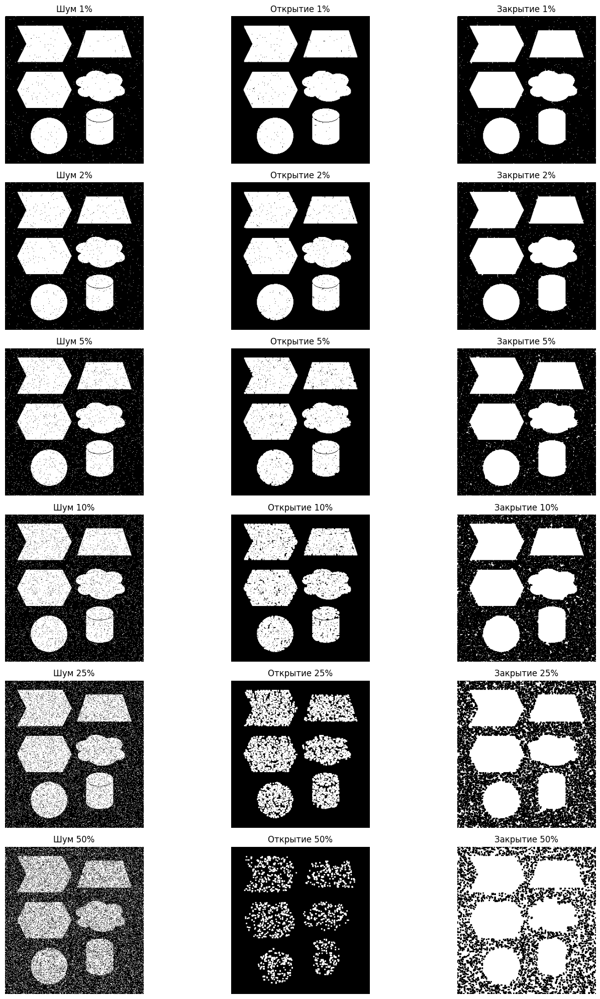

In [ ]:
noise_levels = [0.01, 0.02, 0.05, 0.10, 0.25, 0.50]
noisy_images = []

for level in noise_levels:
    noisy_img = img_binary.copy()
    salt_mask = np.random.random(img_binary.shape) < level/2
    pepper_mask = np.random.random(img_binary.shape) < level/2
    noisy_img[salt_mask] = 255
    noisy_img[pepper_mask] = 0
    noisy_images.append(noisy_img)

kernel = np.ones((3,3), np.uint8)
opened_images = [cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel) for img in noisy_images]
closed_images = [cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel) for img in noisy_images]

plt.figure(figsize=(15, 20))

for i, (level, noisy_img, opened_img, closed_img) in enumerate(zip(noise_levels, noisy_images, opened_images, closed_images)):
    plt.subplot(6, 3, i*3+1)
    plt.imshow(noisy_img, cmap='gray')
    plt.title(f'Шум {int(level*100)}%')
    plt.axis('off')

    plt.subplot(6, 3, i*3+2)
    plt.imshow(opened_img, cmap='gray')
    plt.title(f'Открытие {int(level*100)}%')
    plt.axis('off')

    plt.subplot(6, 3, i*3+3)
    plt.imshow(closed_img, cmap='gray')
    plt.title(f'Закрытие {int(level*100)}%')
    plt.axis('off')

plt.tight_layout()
plt.show()

##Задание 5*

Реализуйте собственные функции эрозии, дилотации, открытия и закрытия для следующих шаблонов и проверьте их работу на зашумленных изображениях:

ValueError: num must be an integer with 1 <= num <= 48, not 49

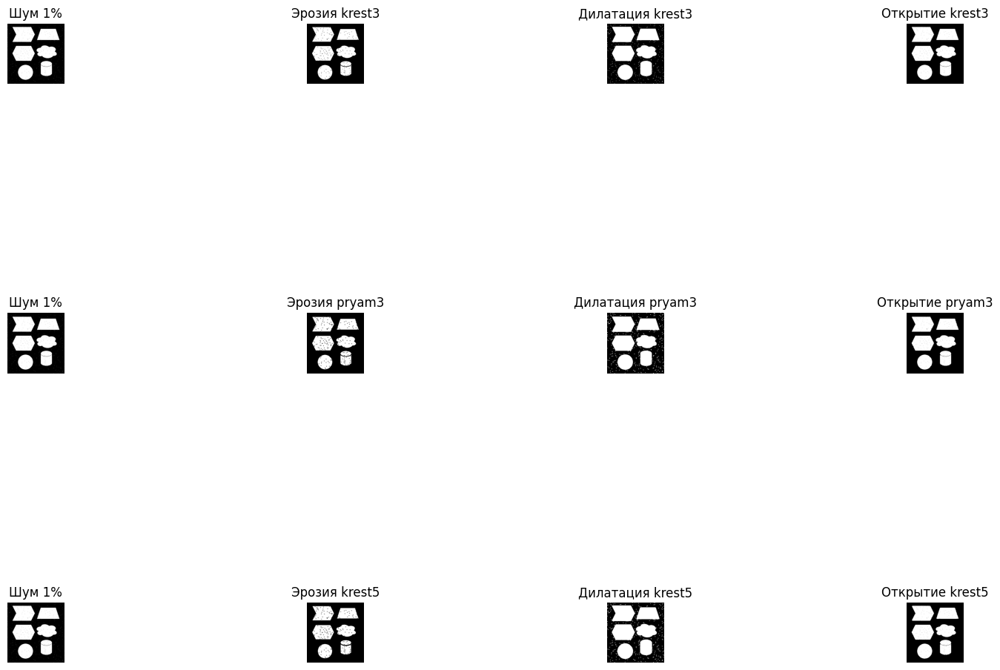

In [ ]:
def my_erosion(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    result = np.zeros_like(image)

    for i in range(h):
        for j in range(w):
            region = padded[i:i+kh, j:j+kw]
            if np.array_equal(region & kernel, kernel):
                result[i, j] = 255

    return result

def my_dilation(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    result = np.zeros_like(image)

    for i in range(h):
        for j in range(w):
            region = padded[i:i+kh, j:j+kw]
            if np.any(region & kernel):
                result[i, j] = 255

    return result

def my_opening(image, kernel):
    return my_dilation(my_erosion(image, kernel), kernel)

def my_closing(image, kernel):
    return my_erosion(my_dilation(image, kernel), kernel)

img = cv2.imread('figures.jpg', 0)
_, img_binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

noise_levels = [0.01, 0.02, 0.05]
noisy_images = []

for level in noise_levels:
    noisy_img = img_binary.copy()
    salt_mask = np.random.random(img_binary.shape) < level/2
    pepper_mask = np.random.random(img_binary.shape) < level/2
    noisy_img[salt_mask] = 255
    noisy_img[pepper_mask] = 0
    noisy_images.append(noisy_img)

templates = {
    'krest3': np.array([[False,True,False],[True,True,True],[False,True,False]], dtype=bool),
    'pryam3': np.ones((3,3), dtype=bool),
    'krest5': np.array([
        [False,False,True,False,False],
        [False,False,True,False,False],
        [True,True,True,True,True],
        [False,False,True,False,False],
        [False,False,True,False,False]], dtype=bool),
    'pryam5': np.ones((5,5), dtype=bool)
}

plt.figure(figsize=(20, 15))

row = 0
for level, noisy_img in zip(noise_levels, noisy_images):
    for name, kernel in templates.items():
        eroded = my_erosion(noisy_img, kernel)
        dilated = my_dilation(noisy_img, kernel)
        opened = my_opening(noisy_img, kernel)
        closed = my_closing(noisy_img, kernel)

        plt.subplot(len(noise_levels)*4, len(templates), row*len(templates)*4 + 1)
        plt.imshow(noisy_img, cmap='gray')
        plt.title(f'Шум {int(level*100)}%')
        plt.axis('off')

        plt.subplot(len(noise_levels)*4, len(templates), row*len(templates)*4 + 2)
        plt.imshow(eroded, cmap='gray')
        plt.title(f'Эрозия {name}')
        plt.axis('off')

        plt.subplot(len(noise_levels)*4, len(templates), row*len(templates)*4 + 3)
        plt.imshow(dilated, cmap='gray')
        plt.title(f'Дилатация {name}')
        plt.axis('off')

        plt.subplot(len(noise_levels)*4, len(templates), row*len(templates)*4 + 4)
        plt.imshow(opened, cmap='gray')
        plt.title(f'Открытие {name}')
        plt.axis('off')

        row += 1

plt.tight_layout()
plt.show()

In [ ]:
#ваш код

##Задание 6*

Сравните результаты полученной раннее функциональной реализации эрозии и дилотации для шаблонов из задания 5 с результатом выполнения соответствующих операций средствами openCV через функции cv2.erode() и cv2.dilate().

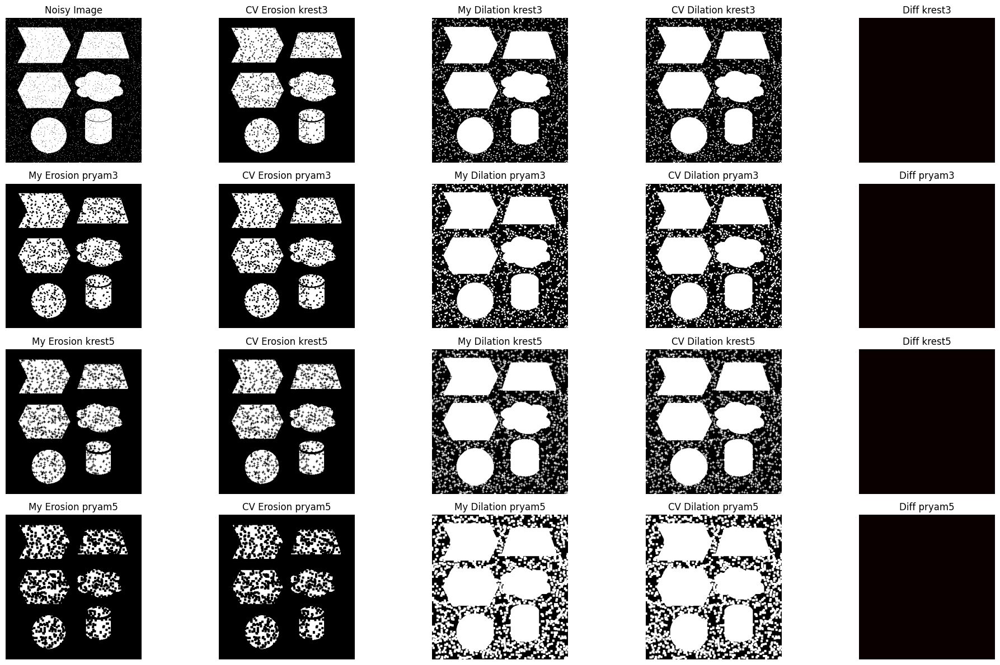

In [ ]:
def my_erosion(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    result = np.zeros_like(image)

    for i in range(h):
        for j in range(w):
            region = padded[i:i+kh, j:j+kw]
            if np.array_equal(region & kernel, kernel):
                result[i, j] = 255

    return result

def my_dilation(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    result = np.zeros_like(image)

    for i in range(h):
        for j in range(w):
            region = padded[i:i+kh, j:j+kw]
            if np.any(region & kernel):
                result[i, j] = 255

    return result

img = cv2.imread('figures.jpg', 0)
_, img_binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

noisy_img = img_binary.copy()
salt_mask = np.random.random(img_binary.shape) < 0.05/2
pepper_mask = np.random.random(img_binary.shape) < 0.05/2
noisy_img[salt_mask] = 255
noisy_img[pepper_mask] = 0

templates = {
    'krest3': np.array([[0,1,0],[1,1,1],[0,1,0]], dtype=np.uint8),
    'pryam3': np.ones((3,3), dtype=np.uint8),
    'krest5': np.array([
        [0,0,1,0,0],
        [0,0,1,0,0],
        [1,1,1,1,1],
        [0,0,1,0,0],
        [0,0,1,0,0]], dtype=np.uint8),
    'pryam5': np.ones((5,5), dtype=np.uint8)
}

plt.figure(figsize=(20, 12))

row = 1
for name, kernel in templates.items():
    my_eroded = my_erosion(noisy_img, kernel)
    cv_eroded = cv2.erode(noisy_img, kernel)

    my_dilated = my_dilation(noisy_img, kernel)
    cv_dilated = cv2.dilate(noisy_img, kernel)

    plt.subplot(4, 5, row)
    plt.imshow(my_eroded, cmap='gray')
    plt.title(f'My Erosion {name}')
    plt.axis('off')

    plt.subplot(4, 5, row+1)
    plt.imshow(cv_eroded, cmap='gray')
    plt.title(f'CV Erosion {name}')
    plt.axis('off')

    plt.subplot(4, 5, row+2)
    plt.imshow(my_dilated, cmap='gray')
    plt.title(f'My Dilation {name}')
    plt.axis('off')

    plt.subplot(4, 5, row+3)
    plt.imshow(cv_dilated, cmap='gray')
    plt.title(f'CV Dilation {name}')
    plt.axis('off')

    plt.subplot(4, 5, row+4)
    diff_erosion = np.abs(my_eroded.astype(float) - cv_eroded.astype(float))
    diff_dilation = np.abs(my_dilated.astype(float) - cv_dilated.astype(float))
    plt.imshow(diff_erosion + diff_dilation, cmap='hot')
    plt.title(f'Diff {name}')
    plt.axis('off')

    row += 5

plt.subplot(4, 5, 1)
plt.imshow(noisy_img, cmap='gray')
plt.title('Noisy Image')
plt.axis('off')

plt.tight_layout()
plt.show()

##Задание 7

Посчитайте качественные метрики MSE и долю отфильтрованных пикселей для зашумленных и обработанных изображений.

Шум: 1.0% | Шаблон: krest3 | Операция: erosion | MSE: 1721.51 | Доля отфильтрованных: 0.028
Шум: 1.0% | Шаблон: krest3 | Операция: dilation | MSE: 2216.16 | Доля отфильтрованных: 0.032
Шум: 1.0% | Шаблон: krest3 | Операция: opening | MSE: 141.33 | Доля отфильтрованных: 0.004
Шум: 1.0% | Шаблон: krest3 | Операция: closing | MSE: 271.89 | Доля отфильтрованных: 0.002
Шум: 1.0% | Шаблон: pryam3 | Операция: erosion | MSE: 2435.55 | Доля отфильтрованных: 0.039
Шум: 1.0% | Шаблон: pryam3 | Операция: dilation | MSE: 3313.13 | Доля отфильтрованных: 0.049
Шум: 1.0% | Шаблон: pryam3 | Операция: opening | MSE: 160.84 | Доля отфильтрованных: 0.004
Шум: 1.0% | Шаблон: pryam3 | Операция: closing | MSE: 296.12 | Доля отфильтрованных: 0.003
Шум: 1.0% | Шаблон: krest5 | Операция: erosion | MSE: 3253.24 | Доля отфильтрованных: 0.052
Шум: 1.0% | Шаблон: krest5 | Операция: dilation | MSE: 4127.45 | Доля отфильтрованных: 0.062
Шум: 1.0% | Шаблон: krest5 | Операция: opening | MSE: 213.34 | Доля отфильтрованн

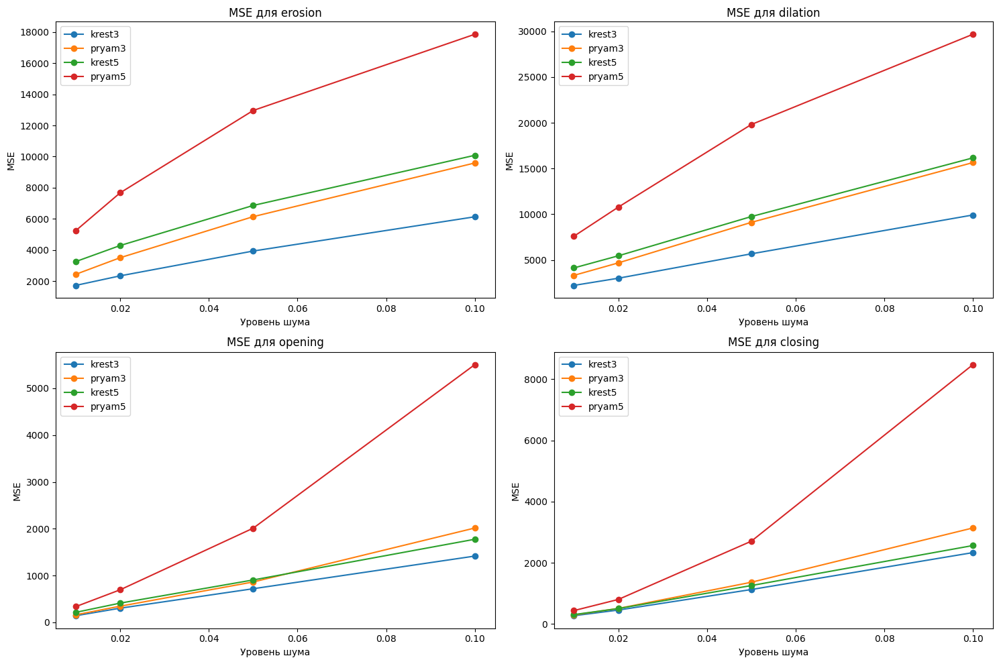

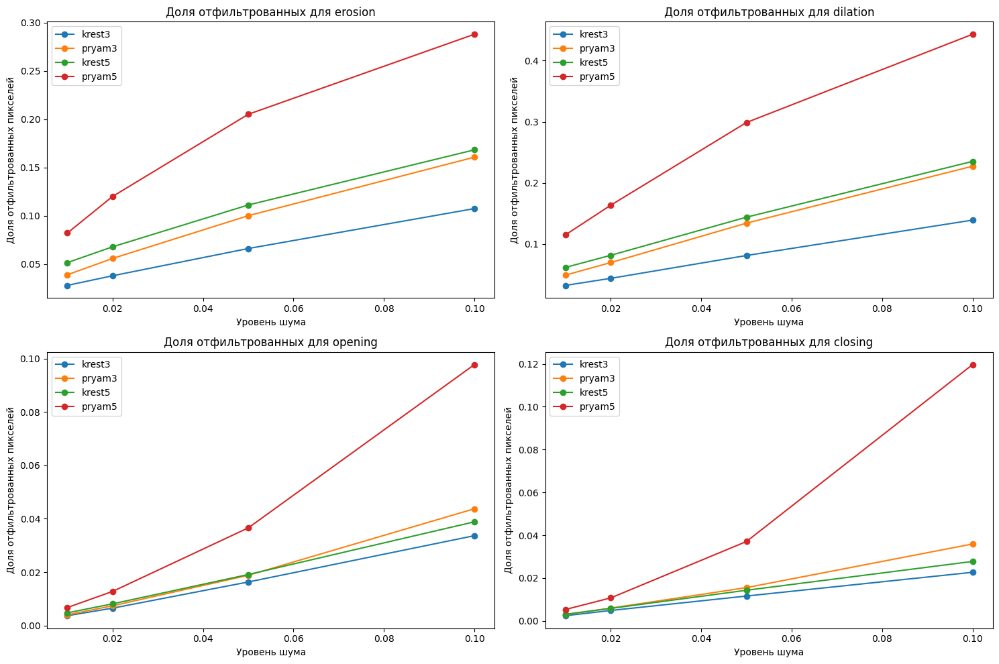

In [ ]:
def my_erosion(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    result = np.zeros_like(image)

    for i in range(h):
        for j in range(w):
            region = padded[i:i+kh, j:j+kw]
            if np.array_equal(region & kernel, kernel):
                result[i, j] = 255

    return result

def my_dilation(image, kernel):
    h, w = image.shape
    kh, kw = kernel.shape
    pad_h, pad_w = kh//2, kw//2

    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)), mode='constant')
    result = np.zeros_like(image)

    for i in range(h):
        for j in range(w):
            region = padded[i:i+kh, j:j+kw]
            if np.any(region & kernel):
                result[i, j] = 255

    return result

def my_opening(image, kernel):
    return my_dilation(my_erosion(image, kernel), kernel)

def my_closing(image, kernel):
    return my_erosion(my_dilation(image, kernel), kernel)

def mse(original, processed):
    return np.mean((original.astype(float) - processed.astype(float)) ** 2)

def filtered_pixels_ratio(original, processed):
    return np.sum(original != processed) / original.size

img = cv2.imread('figures.jpg', 0)
_, img_binary = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)

noise_levels = [0.01, 0.02, 0.05, 0.10]
noisy_images = []

for level in noise_levels:
    noisy_img = img_binary.copy()
    salt_mask = np.random.random(img_binary.shape) < level/2
    pepper_mask = np.random.random(img_binary.shape) < level/2
    noisy_img[salt_mask] = 255
    noisy_img[pepper_mask] = 0
    noisy_images.append(noisy_img)

templates = {
    'krest3': np.array([[0,1,0],[1,1,1],[0,1,0]], dtype=np.uint8),
    'pryam3': np.ones((3,3), dtype=np.uint8),
    'krest5': np.array([
        [0,0,1,0,0],
        [0,0,1,0,0],
        [1,1,1,1,1],
        [0,0,1,0,0],
        [0,0,1,0,0]], dtype=np.uint8),
    'pryam5': np.ones((5,5), dtype=np.uint8)
}

results = []

for level, noisy_img in zip(noise_levels, noisy_images):
    for name, kernel in templates.items():
        eroded = my_erosion(noisy_img, kernel)
        dilated = my_dilation(noisy_img, kernel)
        opened = my_opening(noisy_img, kernel)
        closed = my_closing(noisy_img, kernel)

        results.append({
            'noise_level': level,
            'template': name,
            'operation': 'erosion',
            'mse': mse(img_binary, eroded),
            'filtered_ratio': filtered_pixels_ratio(noisy_img, eroded)
        })

        results.append({
            'noise_level': level,
            'template': name,
            'operation': 'dilation',
            'mse': mse(img_binary, dilated),
            'filtered_ratio': filtered_pixels_ratio(noisy_img, dilated)
        })

        results.append({
            'noise_level': level,
            'template': name,
            'operation': 'opening',
            'mse': mse(img_binary, opened),
            'filtered_ratio': filtered_pixels_ratio(noisy_img, opened)
        })

        results.append({
            'noise_level': level,
            'template': name,
            'operation': 'closing',
            'mse': mse(img_binary, closed),
            'filtered_ratio': filtered_pixels_ratio(noisy_img, closed)
        })

for result in results:
    print(f"Шум: {result['noise_level']*100}% | "
          f"Шаблон: {result['template']} | "
          f"Операция: {result['operation']} | "
          f"MSE: {result['mse']:.2f} | "
          f"Доля отфильтрованных: {result['filtered_ratio']:.3f}")

plt.figure(figsize=(15, 10))

operations = ['erosion', 'dilation', 'opening', 'closing']
for i, op in enumerate(operations):
    plt.subplot(2, 2, i+1)
    for template in templates.keys():
        mse_values = [r['mse'] for r in results if r['operation'] == op and r['template'] == template]
        plt.plot(noise_levels, mse_values[:len(noise_levels)], marker='o', label=template)
    plt.title(f'MSE для {op}')
    plt.xlabel('Уровень шума')
    plt.ylabel('MSE')
    plt.legend()

plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 10))

for i, op in enumerate(operations):
    plt.subplot(2, 2, i+1)
    for template in templates.keys():
        ratio_values = [r['filtered_ratio'] for r in results if r['operation'] == op and r['template'] == template]
        plt.plot(noise_levels, ratio_values[:len(noise_levels)], marker='o', label=template)
    plt.title(f'Доля отфильтрованных для {op}')
    plt.xlabel('Уровень шума')
    plt.ylabel('Доля отфильтрованных пикселей')
    plt.legend()

plt.tight_layout()
plt.show()

## Часть 3. Обнаружение границ с использованием OpenCV и алгоритмов

## Задание 1

Загрузите несколько примеров изображений из Интернета (N > 2), визуалилизируйте их.

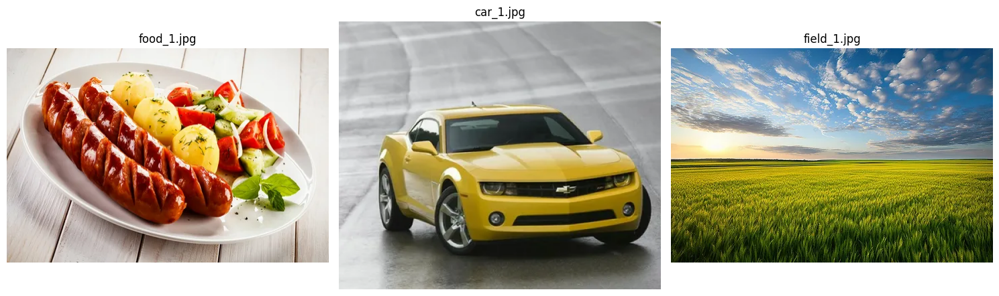

food_1.jpg: размер (320, 480, 3)
car_1.jpg: размер (320, 384, 3)
field_1.jpg: размер (320, 480, 3)


In [ ]:
import cv2
import matplotlib.pyplot as plt

images = []
filenames = ['food_1.jpg', 'car_1.jpg', 'field_1.jpg']

for filename in filenames:
    img = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img_rgb)

plt.figure(figsize=(15, 5))

for i, (filename, img) in enumerate(zip(filenames, images)):
    plt.subplot(1, 3, i+1)
    plt.imshow(img)
    plt.title(filename)
    plt.axis('off')

plt.tight_layout()
plt.show()

for filename, img in zip(filenames, images):
    print(f"{filename}: размер {img.shape}")

## Задание 2

Реализуйте оператор Собеля и определите границы

*Оператор Собеля применяется следующим образом:

$ \Delta_1 = \begin{bmatrix}
   -1 & 0 & 1\\
   -2 & 0 & 2\\
   -1 & 0 & 1
\end{bmatrix} $

$ \Delta_2 = \begin{bmatrix}
   1 & 2 & 1\\
   0 & 0 & 0\\
   -1 & -2 & -1
\end{bmatrix} $

Таким образом, улучшенный край будет рассчитываться как:

$ g(x,y) = \sqrt{\Delta_1^2 + \Delta_2^2} $

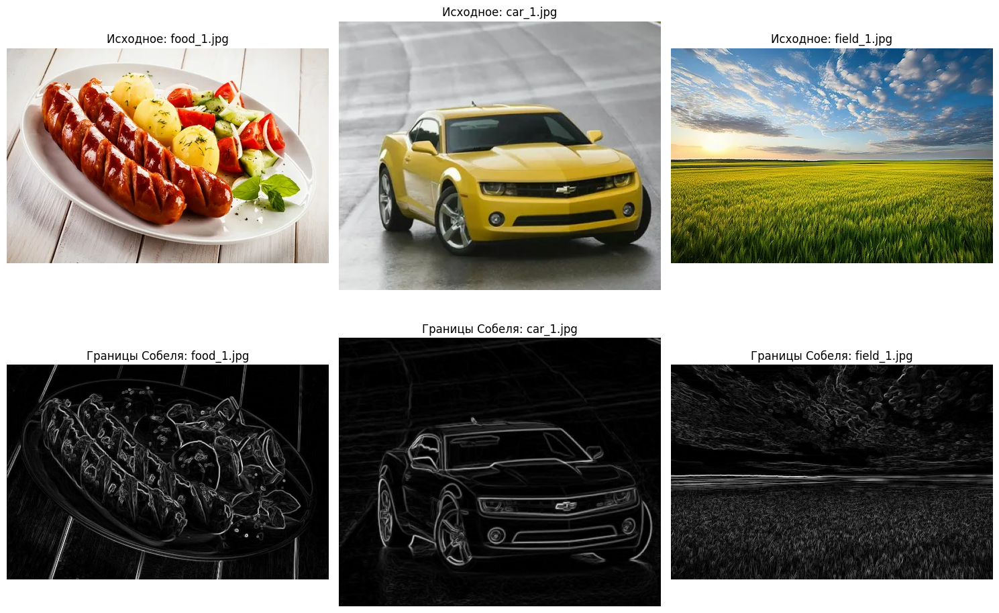

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def sobel_operator(image):
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image

    grad_x = cv2.filter2D(gray.astype(np.float32), -1, sobel_x)
    grad_y = cv2.filter2D(gray.astype(np.float32), -1, sobel_y)

    magnitude = np.sqrt(grad_x**2 + grad_y**2)
    magnitude = (magnitude / magnitude.max() * 255).astype(np.uint8)

    return magnitude


for filename in filenames:
    img = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img_rgb)

plt.figure(figsize=(15, 10))

for i, (filename, img) in enumerate(zip(filenames, images)):
    edges = sobel_operator(img)

    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(f'Исходное: {filename}')
    plt.axis('off')

    plt.subplot(2, 3, i+4)
    plt.imshow(edges, cmap='gray')
    plt.title(f'Границы Собеля: {filename}')
    plt.axis('off')

plt.tight_layout()
plt.show()

##Задание 3

Определите границы изображений с помощью встроенной функций OpenCV: cv2.Sobel(). Рассчитайте отдельно операторы: по каждой из осей, по обеим осям. Визуализируйте и сравните результаты с собственной реализацией.

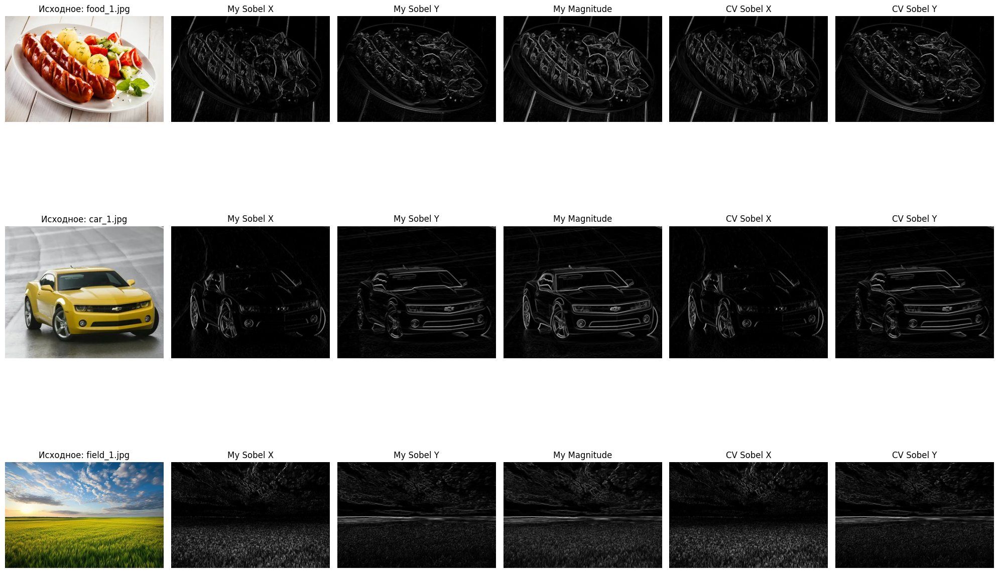

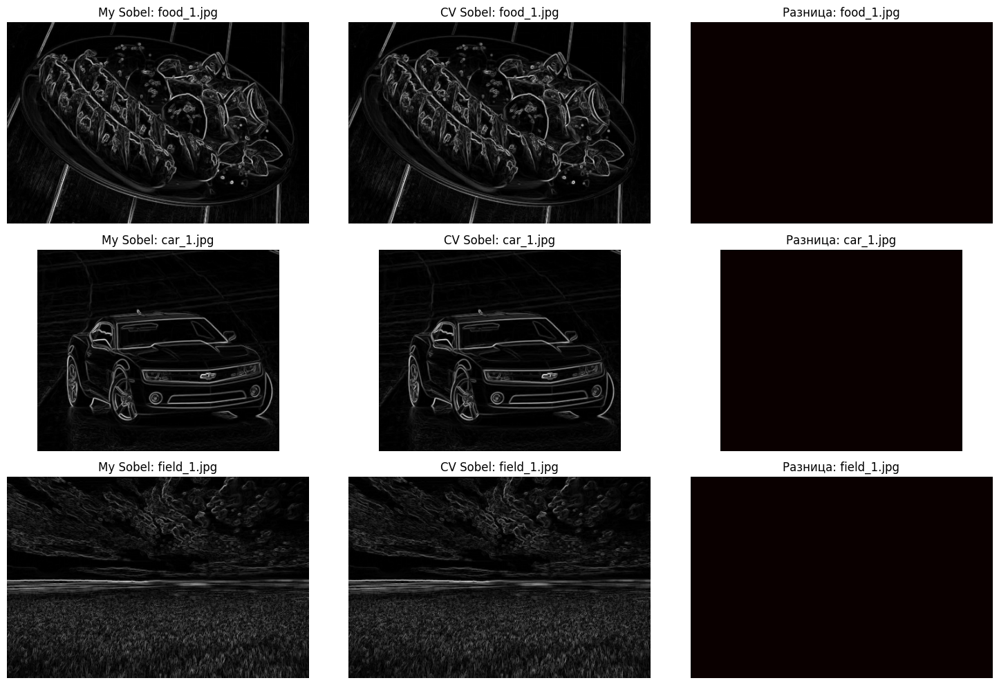

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def my_sobel_operator(image):
    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) if len(image.shape) == 3 else image

    grad_x = cv2.filter2D(gray.astype(np.float32), -1, sobel_x)
    grad_y = cv2.filter2D(gray.astype(np.float32), -1, sobel_y)

    magnitude = np.sqrt(grad_x**2 + grad_y**2)
    magnitude = (magnitude / magnitude.max() * 255).astype(np.uint8)

    return grad_x, grad_y, magnitude



for filename in filenames:
    img = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img_rgb)

plt.figure(figsize=(20, 15))

for i, (filename, img) in enumerate(zip(filenames, images)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    my_grad_x, my_grad_y, my_magnitude = my_sobel_operator(img)

    cv_grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    cv_grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    cv_magnitude = cv2.magnitude(cv_grad_x, cv_grad_y)
    cv_magnitude = (cv_magnitude / cv_magnitude.max() * 255).astype(np.uint8)

    plt.subplot(3, 6, i*6+1)
    plt.imshow(img)
    plt.title(f'Исходное: {filename}')
    plt.axis('off')

    plt.subplot(3, 6, i*6+2)
    plt.imshow(np.abs(my_grad_x), cmap='gray')
    plt.title('My Sobel X')
    plt.axis('off')

    plt.subplot(3, 6, i*6+3)
    plt.imshow(np.abs(my_grad_y), cmap='gray')
    plt.title('My Sobel Y')
    plt.axis('off')

    plt.subplot(3, 6, i*6+4)
    plt.imshow(my_magnitude, cmap='gray')
    plt.title('My Magnitude')
    plt.axis('off')

    plt.subplot(3, 6, i*6+5)
    plt.imshow(np.abs(cv_grad_x), cmap='gray')
    plt.title('CV Sobel X')
    plt.axis('off')

    plt.subplot(3, 6, i*6+6)
    plt.imshow(np.abs(cv_grad_y), cmap='gray')
    plt.title('CV Sobel Y')
    plt.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 10))

for i, (filename, img) in enumerate(zip(filenames, images)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    my_grad_x, my_grad_y, my_magnitude = my_sobel_operator(img)

    cv_grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    cv_grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    cv_magnitude = cv2.magnitude(cv_grad_x, cv_grad_y)
    cv_magnitude = (cv_magnitude / cv_magnitude.max() * 255).astype(np.uint8)

    plt.subplot(3, 3, i*3+1)
    plt.imshow(my_magnitude, cmap='gray')
    plt.title(f'My Sobel: {filename}')
    plt.axis('off')

    plt.subplot(3, 3, i*3+2)
    plt.imshow(cv_magnitude, cmap='gray')
    plt.title(f'CV Sobel: {filename}')
    plt.axis('off')

    plt.subplot(3, 3, i*3+3)
    diff = np.abs(my_magnitude.astype(float) - cv_magnitude.astype(float))
    plt.imshow(diff, cmap='hot')
    plt.title(f'Разница: {filename}')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Задание 4

Реализуйте обнаружение границ с помощью детектора Канни (https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html). Воспользуйтесь встроенным методом cv2.Canny()

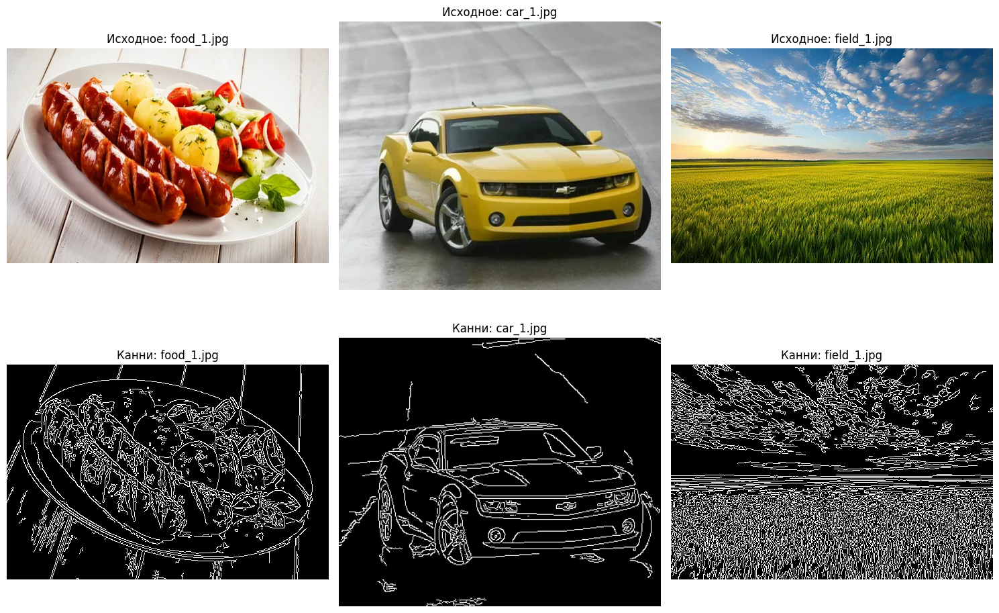

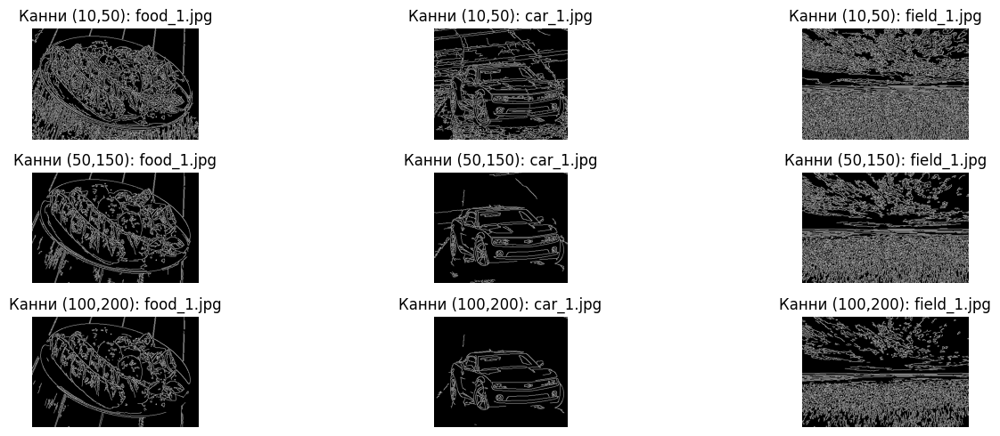

In [ ]:
for filename in filenames:
    img = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img_rgb)

plt.figure(figsize=(15, 10))

for i, (filename, img) in enumerate(zip(filenames, images)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    edges_canny = cv2.Canny(gray, 50, 150)

    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(f'Исходное: {filename}')
    plt.axis('off')

    plt.subplot(2, 3, i+4)
    plt.imshow(edges_canny, cmap='gray')
    plt.title(f'Канни: {filename}')
    plt.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 5))

for i, (filename, img) in enumerate(zip(filenames, images)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    edges_low = cv2.Canny(gray, 10, 50)
    edges_medium = cv2.Canny(gray, 50, 150)
    edges_high = cv2.Canny(gray, 100, 200)

    plt.subplot(3, 3, i+1)
    plt.imshow(edges_low, cmap='gray')
    plt.title(f'Канни (10,50): {filename}')
    plt.axis('off')

    plt.subplot(3, 3, i+4)
    plt.imshow(edges_medium, cmap='gray')
    plt.title(f'Канни (50,150): {filename}')
    plt.axis('off')

    plt.subplot(3, 3, i+7)
    plt.imshow(edges_high, cmap='gray')
    plt.title(f'Канни (100,200): {filename}')
    plt.axis('off')

plt.tight_layout()
plt.show()

#Выводы

Эрозия эффективно удаляет шум типа "соль" и мелкие объекты, но уменьшает размер основных фигур. Дилатация восстанавливает размеры объектов и убирает шум типа "перец", но может соединять близко расположенные элементы. Открытие (эрозия + дилатация) хорошо удаляет шум "соль", сохраняя форму объектов. Закрытие (дилатация + эрозия) эффективно против шума "перец", заполняя внутренние разрывы.